<a href="https://colab.research.google.com/github/fedesfeir/Gas-Prices-Analysis-in-France-2022-2024-/blob/main/SparkProject_Sfeir_Lepore(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Federica Sfeir & Paola Maria Lepore

# Gas Prices Analysis in France (2022–2024)
### Project Introduction
  
The objective of this project is to analyze the evolution of gas prices in France over the period 2022 to 2024, using **Apache Spark** to handle large-scale datasets efficiently.

The analysis focuses on daily fuel prices collected at gas stations across France.  
By leveraging Spark’s distributed computing capabilities, the project aims to process, transform, and analyze the data in a scalable and reproducible way.

Beyond descriptive analysis, the project also includes:
- the construction of synthetic indicators to compare prices across time and space,
- the visualization of national price trends,
- and the development of a predictive model to forecast future gas prices.




## Data Loading Implementation

In this section, a Python function is implemented to automate the data collection and loading phase of the project.

The function downloads all required datasets directly from the official GitHub repository provided.  
This includes:
- gas price data for the years **2022, 2023, and 2024** (with the 2022 data split into two files due to its size),
- the **gas stations** dataset (2024 version),
- and the **services** dataset (2024 version).

The function takes as input a target directory where all files are stored.  
If the directory does not exist, it is automatically created.  
Before downloading each file, the function checks whether it already exists locally, in order to avoid unnecessary re-downloads.

This approach improves the reproducibility of the project and ensures that the data loading process can be executed in a consistent and automated way across different environments.


In [2]:
import os
import urllib.request

def download_gasprice_datasets(target_dir):
    """
    Downloads gas price datasets from the official GitHub repository
    into the specified target directory.
    """

    base_url = "https://raw.githubusercontent.com/rvm-courses/GasPrices/master/"

    files = [
        "Prix2022S1.csv.gz",
        "Prix2022S2.csv.gz",
        "Prix2023.csv.gz",
        "Prix2024.csv.gz",
        "Stations2024.csv.gz",
        "Services2024.csv.gz"
    ]

    os.makedirs(target_dir, exist_ok=True)

    for file in files:
        file_url = base_url + file
        output_path = os.path.join(target_dir, file)

        if not os.path.exists(output_path):
            urllib.request.urlretrieve(file_url, output_path)
            print(f"Downloaded: {file}")
        else:
            print(f"Already exists: {file}")


In [3]:

download_gasprice_datasets("data")

Downloaded: Prix2022S1.csv.gz
Downloaded: Prix2022S2.csv.gz
Downloaded: Prix2023.csv.gz
Downloaded: Prix2024.csv.gz
Downloaded: Stations2024.csv.gz
Downloaded: Services2024.csv.gz


## **Data Preparation - Step 1**

In this step we build the core analytical dataset for the project.

We will:
1. Read all gas price files (2022–2024) and merge them into a single Spark DataFrame.
2. Parse the date column and derive additional time features: **year**, **month**, and **week-of-year**.
3. Load the **Stations (2024)** dataset and prepare **latitude/longitude** for mapping by dividing them by the correct power of 10 (some datasets store coordinates as integers).
4. Make the prepared DataFrames available as **Spark SQL tables** (temporary views) so that the rest of the project can use both DataFrame API and SQL.
5. Use basic statistics to inspect fuel types and optionally filter out the two least frequent types, as suggested in the assignment.


### Spark Session Initialization

We start by creating a SparkSession, which is the entry point for all Spark operations in PySpark.  
This session will be used to load datasets as Spark DataFrames and run both DataFrame transformations and Spark SQL queries.

In [4]:
import pyspark
from pyspark.sql import functions as F
from functools import reduce

# Spark Session
spark = pyspark.sql.SparkSession.builder \
    .appName("SparkMiniProject_GasPrices") \
    .getOrCreate()


### 1. Reading and Merging Gas Price Files (2022–2024)

The gas price dataset is distributed across multiple compressed CSV files:
- 2022 is split into two parts (S1 and S2),
- 2023 and 2024 each have a single file.

These CSV files do not contain headers and use `;` as delimiter, so we explicitly set:
- `header=False`
- `sep=";"`

After loading each file as a Spark DataFrame, we merge them using `unionByName()` to obtain a single unified dataset covering 2022–2024.


In [5]:
# 1) Read and merge all gas files (Prix2022S1, Prix2022S2, Prix2023, Prix2024)

DATA_DIR = "data"

price_paths = [
    f"{DATA_DIR}/Prix2022S1.csv.gz",
    f"{DATA_DIR}/Prix2022S2.csv.gz",
    f"{DATA_DIR}/Prix2023.csv.gz",
    f"{DATA_DIR}/Prix2024.csv.gz",
]

# We load each file and then union them into one datasetS1
# Gas price files have no header and use ';' as separator

price_dfs = [
    spark.read
        .option("header", False)
        .option("sep", ";")
        .option("inferSchema", True)
        .csv(p)
    for p in price_paths
]

# Merge all years into a single DataFrame
gas_df = reduce(lambda a, b: a.unionByName(b), price_dfs)

# Rename autogenerated columns (_c0.._c8)
gas_df = gas_df.toDF(
    "station_id",
    "area_code",
    "area_type",
    "lat_raw",
    "lon_raw",
    "timestamp",
    "gas_id",
    "gas_type",
    "price"
)

gas_df.printSchema()
gas_df.show(5, truncate=False)


root
 |-- station_id: integer (nullable = true)
 |-- area_code: integer (nullable = true)
 |-- area_type: string (nullable = true)
 |-- lat_raw: double (nullable = true)
 |-- lon_raw: double (nullable = true)
 |-- timestamp: timestamp (nullable = true)
 |-- gas_id: integer (nullable = true)
 |-- gas_type: string (nullable = true)
 |-- price: double (nullable = true)

+----------+---------+---------+---------+--------+-------------------+------+--------+-----+
|station_id|area_code|area_type|lat_raw  |lon_raw |timestamp          |gas_id|gas_type|price|
+----------+---------+---------+---------+--------+-------------------+------+--------+-----+
|1000001   |1000     |R        |4620100.0|519800.0|2022-01-03 08:44:18|1     |Gazole  |1.572|
|1000001   |1000     |R        |4620100.0|519800.0|2022-01-05 10:08:11|1     |Gazole  |1.56 |
|1000001   |1000     |R        |4620100.0|519800.0|2022-01-10 10:09:08|1     |Gazole  |1.603|
|1000001   |1000     |R        |4620100.0|519800.0|2022-01-17 12:3

### 2. Time Features: year, month, and week-of-year

The raw dataset contains a timestamp column.  
To support time-based aggregation (weekly trends, seasonality, etc.), we derive:
- `date` (date part of the timestamp),
- `year`,
- `month`,
- `weekofyear`.

These features will be essential later for computing weekly averages and defining a week index.


In [6]:
# 2) Split date in year, month, week of the year
# Extract date part and derive time-based features for aggregation

gas_df = (
    gas_df
    .withColumn("date", F.to_date("timestamp"))
    .withColumn("year", F.year("date"))
    .withColumn("month", F.month("date"))
    .withColumn("weekofyear", F.weekofyear("date"))
)

gas_df.select("timestamp", "date", "year", "month", "weekofyear").show(5, truncate=False)


+-------------------+----------+----+-----+----------+
|timestamp          |date      |year|month|weekofyear|
+-------------------+----------+----+-----+----------+
|2022-01-03 08:44:18|2022-01-03|2022|1    |1         |
|2022-01-05 10:08:11|2022-01-05|2022|1    |1         |
|2022-01-10 10:09:08|2022-01-10|2022|1    |2         |
|2022-01-17 12:34:42|2022-01-17|2022|1    |3         |
|2022-01-17 12:34:44|2022-01-17|2022|1    |3         |
+-------------------+----------+----+-----+----------+
only showing top 5 rows


### 3. Geographic Features: Latitude and Longitude Normalization

In the raw dataset, latitude and longitude are stored as scaled integers (e.g., `4620100` instead of `46.20100`).  
To make these coordinates usable for mapping and spatial analysis, we convert them into real decimal degrees.

Based on the observed values, coordinates are scaled by 10^5, so we divide by `1e5` and create:
- `lat`
- `lon`

We also validate the result by checking example conversions (raw vs. converted) and the global min/max latitude and longitude to detect obvious inconsistencies.


In [7]:
# 3)Coordinates are stored as integers scaled by 1e5 (e.g., 4620100 -> 46.20100)

gas_df = (
    gas_df
    .withColumn("lat", F.col("lat_raw") / F.lit(1e5))
    .withColumn("lon", F.col("lon_raw") / F.lit(1e5))
)

gas_df.select("lat_raw", "lon_raw", "lat", "lon").show(5, truncate=False)


+---------+--------+------+-----+
|lat_raw  |lon_raw |lat   |lon  |
+---------+--------+------+-----+
|4620100.0|519800.0|46.201|5.198|
|4620100.0|519800.0|46.201|5.198|
|4620100.0|519800.0|46.201|5.198|
|4620100.0|519800.0|46.201|5.198|
|4620100.0|519800.0|46.201|5.198|
+---------+--------+------+-----+
only showing top 5 rows


In [8]:
gas_df.select(
    F.min("lat").alias("min_lat"), F.max("lat").alias("max_lat"),
    F.min("lon").alias("min_lon"), F.max("lon").alias("max_lon")
).show()


+----------------+-------------+-------+---------------+
|         min_lat|      max_lat|min_lon|        max_lon|
+----------------+-------------+-------+---------------+
|-20.949713596753|62.6065598007| -4.723|55.295260602666|
+----------------+-------------+-------+---------------+



The presence of negative latitudes suggests the dataset includes French overseas territories, not only mainland France.

### 4. Creating a Spark SQL Table (Temporary View)

To enable both DataFrame operations and SQL-based analysis, we register the prepared dataset as a Spark SQL temporary view named `gas_prices`.

This allows us to:
- quickly run validation queries (counts per year, missing values),
- compute summary statistics using SQL,
- reuse the view in subsequent steps of the project.


In [9]:
# 4) Make data available as a table (Spark SQL)

gas_df.createOrReplaceTempView("gas_prices")

spark.sql("""
SELECT year, COUNT(*) AS n_rows
FROM gas_prices
GROUP BY year
ORDER BY year
""").show()

spark.sql("SELECT COUNT(*) AS n FROM gas_prices").show()


+----+-------+
|year| n_rows|
+----+-------+
|NULL|  12756|
|2022|4931115|
|2023|4683353|
|2024|4587613|
+----+-------+

+--------+
|       n|
+--------+
|14214837|
+--------+



The first table shows the distribution of observations by year. Most records belong to the years 2022, 2023, and 2024, confirming that the data loading and merging process was successful. A small number of records have a missing year value (NULL) and will be addressed during data cleaning.

The second table reports the total number of observations (n), highlighting the large scale of the dataset and its suitability for Spark-based analysis.

In [10]:
gas_df.printSchema()
print(gas_df.columns)
gas_df.show(5, truncate=False)


root
 |-- station_id: integer (nullable = true)
 |-- area_code: integer (nullable = true)
 |-- area_type: string (nullable = true)
 |-- lat_raw: double (nullable = true)
 |-- lon_raw: double (nullable = true)
 |-- timestamp: timestamp (nullable = true)
 |-- gas_id: integer (nullable = true)
 |-- gas_type: string (nullable = true)
 |-- price: double (nullable = true)
 |-- date: date (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- weekofyear: integer (nullable = true)
 |-- lat: double (nullable = true)
 |-- lon: double (nullable = true)

['station_id', 'area_code', 'area_type', 'lat_raw', 'lon_raw', 'timestamp', 'gas_id', 'gas_type', 'price', 'date', 'year', 'month', 'weekofyear', 'lat', 'lon']
+----------+---------+---------+---------+--------+-------------------+------+--------+-----+----------+----+-----+----------+------+-----+
|station_id|area_code|area_type|lat_raw  |lon_raw |timestamp          |gas_id|gas_type|price|date      |year

From the schema inspection:
- All core identifiers (`station_id`, `area_code`, `gas_id`) are stored as integers.
- The `timestamp` column is correctly parsed as a Spark `timestamp` type.
- The `price` variable is stored as a `double`, which is appropriate for numerical analysis.
- Derived temporal features (`date`, `year`, `month`, `weekofyear`) are correctly added and typed.
- Geographic features (`lat_raw`, `lon_raw`) are preserved, and the normalized coordinates (`lat`, `lon`) are available as decimal values.

The sample rows further validate the transformations:
- Raw coordinates such as `4620100` are correctly converted into latitude `46.201` and longitude `5.198`.
- Time features are consistent: dates in early January 2022 correctly fall into weeks 1, 2, and 3.
- Prices appear realistic and consistent with typical fuel prices during the period.


In [11]:
from pyspark.sql import functions as F

gas_df.select([
    F.count(F.when(F.col(c).isNull(), 1)).alias(c)
    for c in gas_df.columns
]).show(truncate=False)


+----------+---------+---------+-------+-------+---------+------+--------+-----+-----+-----+-----+----------+---+---+
|station_id|area_code|area_type|lat_raw|lon_raw|timestamp|gas_id|gas_type|price|date |year |month|weekofyear|lat|lon|
+----------+---------+---------+-------+-------+---------+------+--------+-----+-----+-----+-----+----------+---+---+
|0         |0        |0        |207    |204    |12756    |12756 |12756   |12756|12756|12756|12756|12756     |207|204|
+----------+---------+---------+-------+-------+---------+------+--------+-----+-----+-----+-----+----------+---+---+



#### Missing Values Analysis

The table above reports the number of missing (`NULL`) values for each column in the dataset.

Key observations:
- Most core identifier fields (`station_id`, `area_code`, `area_type`) do not contain missing values.
- A consistent number of approximately **12,756 missing values** appears across several columns, including:
  - `timestamp`
  - `gas_id`
  - `gas_type`
  - `price`
  - derived time features (`date`, `year`, `month`, `weekofyear`)
- This pattern suggests that these missing values correspond to the same set of rows, likely caused by invalid or missing timestamp information in the original data.

For geographic variables:
- A small number of missing values is observed for `lat_raw` and `lon_raw` (around **200 rows**), which remains negligible compared to the total dataset size.

Given the very small proportion of affected rows relative to the overall dataset, these records can be safely excluded in subsequent steps without impacting the quality of the analysis.  
Identifying and quantifying missing values at this stage ensures that the dataset is reliable before computing aggregated statistics and derived indicators.


In [12]:
gas_df.select(
    F.min("price").alias("min_price"),
    F.max("price").alias("max_price"),
    F.avg("price").alias("avg_price")
).show()


+---------+---------+------------------+
|min_price|max_price|         avg_price|
+---------+---------+------------------+
|    0.001|    9.999|1.7156871643710394|
+---------+---------+------------------+



#### Basic Price Statistics Analysis

The table above reports basic descriptive statistics for the fuel price variable across the entire dataset.

- The average price is approximately 1.72 euros per liter, which is consistent with typical fuel prices observed in France during the 2022–2024 period.
- The minimum price (`0.001`) and maximum price (`9.999`) are clearly extreme values and do not represent realistic market prices.

These extreme values most likely correspond to placeholder values, data entry errors or specific administrative codes used in the original data source.


### Fuel Type Selection and Filtering


In [13]:
spark.sql("""
SELECT
    gas_type,
    COUNT(*) AS n_rows,
    COUNT(DISTINCT year) AS n_years,
    COUNT(DISTINCT date) AS n_days,
    AVG(price) AS avg_price
FROM gas_prices
WHERE year IS NOT NULL
GROUP BY gas_type
ORDER BY n_rows DESC
""").show(truncate=False)


+--------+-------+-------+------+------------------+
|gas_type|n_rows |n_years|n_days|avg_price         |
+--------+-------+-------+------+------------------+
|Gazole  |4245380|3      |1087  |1.8076891830658834|
|E10     |3559498|3      |1087  |1.8212468297499682|
|SP98    |3425844|3      |1087  |1.914608725324682 |
|E85     |1390580|3      |1087  |0.921419896733133 |
|SP95    |961020 |3      |1087  |1.8487364893548799|
|GPLc    |619759 |3      |1087  |0.9554431512899029|
+--------+-------+-------+------+------------------+



The table presents a detailed summary of the dataset by fuel type, including the total number of records, temporal coverage in years and days and the average price per fuel type.

All fuel types cover the same period (3 years and 1,087 days), which ensures temporal consistency across categories.  
However, there are notable differences in the volume of observations and market relevance.

- **Gazole**, **E10**, and **SP98** clearly dominate the dataset, each with several million records.  
  These fuels represent the core of the French fuel market and are therefore highly relevant for analyzing price evolution.
- **SP95** has fewer records than SP98 and E10 but still shows substantial coverage and represents a commonly used gasoline type.
- **E85** and **GPLc** have significantly fewer observations and much lower average prices, reflecting their more specific and niche market segments (bioethanol and liquefied petroleum gas).

Based on their lower frequency of observations and their limited representativeness for the main market, E85 and GPLc are excluded from the dataset in order to focus the analysis on the most informative fuel types.


In [14]:
GAS_TYPES_TO_REMOVE = ["E85", "GPLc"]

gas_df = gas_df.filter(~F.col("gas_type").isin(GAS_TYPES_TO_REMOVE))


After applying this filter, a verification query is executed to check the remaining fuel types.  
This confirms that the dataset now contains only the selected fuel categories, while records with `NULL` fuel type remain visible and can be handled separately if needed.

This filtering step simplifies the dataset and improves the robustness of subsequent analyses, such as price index computation, visualization, and modeling.


In [15]:
spark.sql("""
SELECT gas_type, COUNT(*) AS n_rows
FROM gas_prices
GROUP BY gas_type
ORDER BY n_rows DESC
""").show()


+--------+-------+
|gas_type| n_rows|
+--------+-------+
|  Gazole|4245380|
|     E10|3559498|
|    SP98|3425844|
|     E85|1390580|
|    SP95| 961020|
|    GPLc| 619759|
|    NULL|  12756|
+--------+-------+



# **Data Preparation – Step 2**: Price Index computation

In this step we compute a weekly **Price Index** for each gas type sold in each station.

The Price Index measures how the price at a given station compares to the
average price in France for the same gas type and time period.

For each week, the Price Index is defined as:

Price Index = 100 × ( (Station Average Price − National Average Price)
                      / National Average Price + 1 )

This indicator allows us to compare stations independently from the absolute
price level and to identify stations that are consistently more or less expensive
than the national average.


### Cleaning the Dataset for Index Computation

Before computing the index, we create a cleaned version of the dataset by removing rows with missing values in key analytical fields:
- `year`, `date`, `price`, and `gas_type`

This step ensures that aggregations (national averages) are correct, joins do not generate null results and the index is computed only on valid observations.


In [16]:
gas_df.createOrReplaceTempView("gas_prices")


In [17]:
spark.sql("""
CREATE OR REPLACE TEMP VIEW gas_prices_clean AS
SELECT *
FROM gas_prices
WHERE year IS NOT NULL
  AND date IS NOT NULL
  AND price IS NOT NULL
  AND gas_type IS NOT NULL
""")


DataFrame[]


To compute the Price Index, we first use the national average price in France as a reference benchmark, computed for each date and fuel type.

This produces a table with one row per `(date, gas_type)` containing `france_avg_price`, which is the average observed price across all stations in France for that day and fuel type.

This benchmark is then joined back to each station record to compute its relative deviation from the national price level.


In [18]:
# Compute the national daily average price by fuel type (benchmark for the Price Index)
spark.sql("""
CREATE OR REPLACE TEMP VIEW france_daily_avg AS
SELECT
    date,
    gas_type,
    AVG(price) AS france_avg_price
FROM gas_prices_clean
GROUP BY date, gas_type
""")


DataFrame[]

In [19]:
spark.sql("SELECT * FROM france_daily_avg LIMIT 10").show(truncate=False)


+----------+--------+------------------+
|date      |gas_type|france_avg_price  |
+----------+--------+------------------+
|2022-06-27|Gazole  |2.1379262202043243|
|2022-05-02|SP95    |1.8441480987324879|
|2022-04-26|SP98    |1.8615995024875631|
|2022-01-31|Gazole  |1.703071628427535 |
|2022-01-11|Gazole  |1.6313233468863693|
|2022-03-05|SP98    |1.977763850027976 |
|2022-05-18|E10     |1.9632899369702215|
|2022-04-13|Gazole  |1.814814352192005 |
|2022-01-22|SP95    |1.7393150442477898|
|2022-06-30|SP95    |2.097055295220239 |
+----------+--------+------------------+



Once the national benchmark is available, we compute the Price Index for each station record.

For each observation (station, date, gas_type), the index is defined as:

$$
\text{Price Index} = 100 \times \left( \frac{\text{price} - \text{france_avg_price}}{\text{france_avg_price}} + 1 \right)
$$

Interpretation:
- Price Index = 100 → the station price equals the national average for that day and fuel type.
- Price Index > 100 → the station is more expensive than the national average.
- Price Index < 100 → the station is cheaper than the national average.

This normalization makes prices comparable across fuel types and time periods.


In [20]:
# Join each station-day price with the national daily average (same date and fuel type),
# then compute a normalized Price Index centered around 100.
spark.sql("""
CREATE OR REPLACE TEMP VIEW gas_with_price_index AS
SELECT
    g.*,
    a.france_avg_price,
    100 * ( (g.price - a.france_avg_price) / a.france_avg_price + 1 ) AS price_index
FROM gas_prices_clean g
JOIN france_daily_avg a
  ON g.date = a.date
 AND g.gas_type = a.gas_type
""")


DataFrame[]

In [21]:
spark.sql("""
SELECT
  station_id, date, gas_type, price, france_avg_price, price_index
FROM gas_with_price_index
ORDER BY date, gas_type
LIMIT 10
""").show(truncate=False)


+----------+----------+--------+-----+------------------+------------------+
|station_id|date      |gas_type|price|france_avg_price  |price_index       |
+----------+----------+--------+-----+------------------+------------------+
|1000012   |2022-01-01|E10     |1.714|1.6803428869202677|102.00299077894863|
|1430003   |2022-01-01|E10     |1.819|1.6803428869202677|108.25171541826579|
|1000013   |2022-01-01|E10     |1.609|1.6803428869202677|95.75426613963148 |
|1120008   |2022-01-01|E10     |1.769|1.6803428869202677|105.2761322566862 |
|1130003   |2022-01-01|E10     |1.649|1.6803428869202677|98.13473266889517 |
|1160005   |2022-01-01|E10     |1.646|1.6803428869202677|97.95619767920039 |
|1170001   |2022-01-01|E10     |1.576|1.6803428869202677|93.79038125298895 |
|1250005   |2022-01-01|E10     |1.814|1.6803428869202677|107.95415710210783|
|1390009   |2022-01-01|E10     |1.809|1.6803428869202677|107.65659878594987|
|1390011   |2022-01-01|E10     |1.768|1.6803428869202677|105.2166205934546 |

For a fixed date (`2022-01-01`) and fuel type (`E10`), the national average price in France is approximately 1.68 €/L.  
Each station’s price is compared against this benchmark:

- A Price Index greater than 100 indicates that the station is more expensive than the national average on that day.
- A Price Index lower than 100 indicates that the station is cheaper than the national average.
- A Price Index equal to 100 would indicate perfect alignment with the national average.

For example:
- Station `1430003` has a price of 1.819 €/L, resulting in a Price Index of 108.25, meaning the price is about 8.25% higher than the national average.
- Station `1000013` has a price of 1.609 €/L, with a Price Index of 95.75, indicating a price approximately 4.25% lower than the national average.

This sample confirms that the Price Index behaves as expected and provides an intuitive, normalized measure for comparing station-level prices across time and fuel types.

In [22]:
spark.sql("""
SELECT
  MIN(price_index) AS min_idx,
  MAX(price_index) AS max_idx,
  AVG(price_index) AS avg_idx
FROM gas_with_price_index
""").show()


+-------------------+----------------+-----------------+
|            min_idx|         max_idx|          avg_idx|
+-------------------+----------------+-----------------+
|0.05097669940030691|597.972892493076|99.99999999997104|
+-------------------+----------------+-----------------+



To validate the computation, we check global statistics of the Price Index (minimum, maximum and average)

The average should be close to 100, because the index is defined relative to the national average.
Extreme values may reveal outliers or abnormal prices in the raw dataset.

### Week Index (Continuous Weekly Time Variable)

The variable `weekofyear` resets every year (1–52/53), which is not ideal for time series analysis across multiple years.

To address this, we create a **Week Index** that continuously counts weeks across the entire period:
- first week of 2022 → index 1
- last week of 2024 → index 156

This provides a clean and consistent temporal axis for weekly aggregation and trend modeling.


In [23]:
#check
spark.sql("SELECT COUNT(*) FROM gas_with_price_index").show()


+--------+
|count(1)|
+--------+
|12191742|
+--------+



In [24]:
# Extract distinct (year, weekofyear) combinations to identify all calendar weeks in the dataset
spark.sql("""
CREATE OR REPLACE TEMP VIEW distinct_weeks AS
SELECT DISTINCT
    year,
    weekofyear
FROM gas_with_price_index
WHERE year IS NOT NULL
""")


DataFrame[]

In [25]:
# Create a continuous week index across years using DENSE_RANK ordered by year and week number

spark.sql("""
CREATE OR REPLACE TEMP VIEW week_index_table AS
SELECT
    year,
    weekofyear,
    DENSE_RANK() OVER (ORDER BY year, weekofyear) AS week_index
FROM distinct_weeks
""")


DataFrame[]

In [26]:
spark.sql("""
SELECT *
FROM week_index_table
ORDER BY week_index
LIMIT 10
""").show()


+----+----------+----------+
|year|weekofyear|week_index|
+----+----------+----------+
|2022|         1|         1|
|2022|         2|         2|
|2022|         3|         3|
|2022|         4|         4|
|2022|         5|         5|
|2022|         6|         6|
|2022|         7|         7|
|2022|         8|         8|
|2022|         9|         9|
|2022|        10|        10|
+----+----------+----------+



The table above shows the first values of the `week_index_table`, ordered by the continuous `week_index`.

The results confirm that:
- the first week of **2022** (`weekofyear = 1`) is correctly assigned `week_index = 1`,
- subsequent weeks are incremented sequentially without gaps,
- the ordering is consistent with the calendar structure.

This validation confirms that the `week_index` correctly represents a continuous time variable across years and can be safely used for weekly aggregation and time series analysis in the following steps.


In [27]:
spark.sql("""
CREATE OR REPLACE TEMP VIEW gas_with_week_index AS
SELECT
    g.*,
    w.week_index
FROM gas_with_price_index g
JOIN week_index_table w
  ON g.year = w.year
 AND g.weekofyear = w.weekofyear
""")


DataFrame[]

In [28]:
spark.sql("""
SELECT
    MIN(week_index) AS min_week,
    MAX(week_index) AS max_week
FROM gas_with_week_index
""").show()


+--------+--------+
|min_week|max_week|
+--------+--------+
|       1|     156|
+--------+--------+




Finally, the query above verifies the range of the computed `week_index` after joining it back to the full dataset.

The results show that:
- the minimum value of `week_index` is 1, corresponding to the first week of 2022,
- the maximum value of `week_index` is 156, which matches exactly 3 years × 52 weeks (2022–2024).

This confirms that the `week_index` has been correctly propagated to all records and provides a continuous, gap-free time variable covering the entire analysis period.  
The dataset is now fully prepared for weekly aggregations, trend analysis, and time-series modeling in the next stages of the project.


## **Data visualization**: Weekly Evolution of Gas Prices in France (2022–2024)


This section shows the analysis of temporal evolution of gas price in France. Using the previous computed `week_index`, we will focus on the weekly average price at national level: we will compare the gas types through their trends over time.



In [29]:
# Prepare a clean dataset for visualization by keeping only valid weekly prices

spark.sql("""
CREATE OR REPLACE TEMP VIEW plot_base AS
SELECT
    week_index,
    gas_type,
    price
FROM gas_with_week_index
WHERE week_index IS NOT NULL
  AND price IS NOT NULL
  AND gas_type IS NOT NULL
""")


DataFrame[]

In [30]:
# Weekly average price in France by gas type

spark.sql("""
CREATE OR REPLACE TEMP VIEW france_weekly_avg AS
SELECT
    week_index,
    gas_type,
    AVG(price) AS avg_price_france
FROM plot_base
GROUP BY week_index, gas_type
ORDER BY week_index, gas_type
""")


DataFrame[]

In [31]:
spark.sql("SELECT * FROM france_weekly_avg LIMIT 10").show(truncate=False)


+----------+--------+------------------+
|week_index|gas_type|avg_price_france  |
+----------+--------+------------------+
|1         |E10     |1.6723795238475512|
|1         |Gazole  |1.6024942140468232|
|1         |SP95    |1.684997993579457 |
|1         |SP98    |1.763616937878566 |
|2         |E10     |1.6970892590856579|
|2         |Gazole  |1.637553033387648 |
|2         |SP95    |1.7143566056478006|
|2         |SP98    |1.7875698059432523|
|3         |E10     |1.7134999124649801|
|3         |Gazole  |1.6662801377726708|
+----------+--------+------------------+



This table reports the weekly average gas price in France, `avg_price_france`, for each gas type. For a given `week index`, each row shows the national mean price computed aggregating all available station-level prices across France.  
In the same week, each gas have a distinct average price: in general, SP98 is the most expensive, while Gazole is the cheapest, showing systematic differences between gas prices.  
This table is the first step to build the weekly trend visualization, showing a representation of national price dynamics.

In [32]:
# Convert the weekly Spark aggregation to a Pandas DataFrame for visualization

pdf = spark.sql("""
SELECT week_index, gas_type, avg_price_france
FROM france_weekly_avg
ORDER BY week_index, gas_type
""").toPandas()

pdf.head()


,week_index,gas_type,avg_price_france
0,1,E10,1.672380
1,1,Gazole,1.602494
2,1,SP95,1.684998
3,1,SP98,1.763617
4,2,E10,1.697089


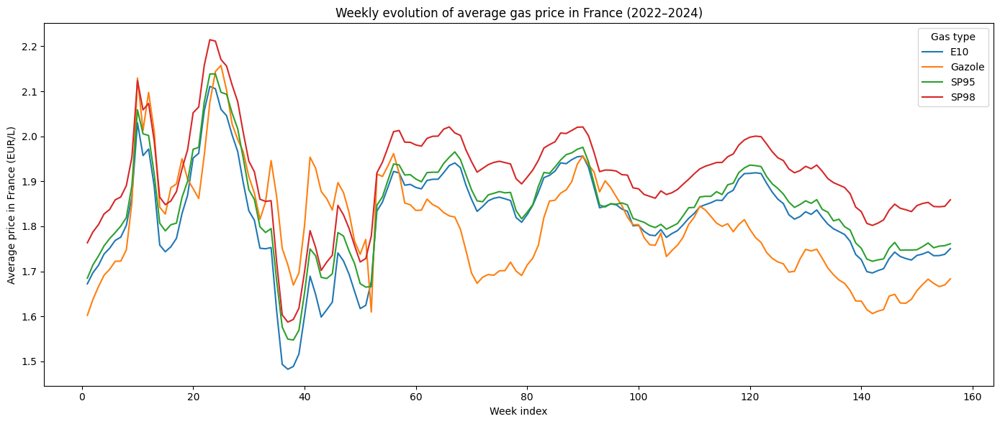

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Y = average price for gas type in France over the week index
# X = week index
# Each colored line is a different gas type

plt.figure(figsize=(14, 6))
sns.lineplot(data=pdf, x="week_index", y="avg_price_france", hue="gas_type")

plt.title("Weekly evolution of average gas price in France (2022–2024)")
plt.xlabel("Week index")
plt.ylabel("Average price in France (EUR/L)")
plt.legend(title="Gas type")
plt.tight_layout()
plt.show()


The plot shows the weekly evolution of average gas prices in France in 2022 (week 1 to 52), 2023 (week 53 to 104) and 2024 (week 105 to 156).  
All the gas types exhibit strong temporal patterns: in the early weeks of 2022 there is a sharp increase, followed by an important decrease at the end of the same year. Despite some fluctuations, between 2023 and early 2024, prices tend to stabilize, untile late 2024 in which a mild decrease is observed.  

Despite this common behaviour, visible differences persist between differente gas types. After briefly exceeding SP98 during a short period, i.e. between 35 and 55 week of 2022, <font color="orange">Gazole</font> experience a marked decrease, remaining consistenlty the cheapest throughout both 2023 and 2024. Conversely <font color="darkred">SP98</font> is almost always the most expensive.  
In 2022 <font color="blue">E10</font> has most convenient prices, staying above all other gas types, showing smoother variations, while <font color="green">SP95</font> generally lies between the cheapest and the more expensive ones.  

The visualization highlights that gas price fluctuations are mainly driven by global market conditions, whereas relative price differences between gas types remain stable throughout the period of observation.


## **Data Visualization**: Department-Level Price Index Maps

Now we explore the spatial variability of fuel prices in France.  

We use the previously computed **price index** (baseline = 100 at national level) and aggregate it at **department level** for each gas type.  
The resulting values are then visualized through **choropleth maps** (GeoPandas + Folium), where departments with an index above 100 are relatively more expensive than the national average, while departments below 100 are relatively cheaper.

In [34]:
import pandas as pd
import geopandas as gpd
import folium

In [35]:
# Check of the final dataset, gas_with_week_index, used for geographic aggregation

spark.sql("SELECT area_code, gas_type, price_index, week_index FROM gas_with_week_index LIMIT 5").show()

+---------+--------+------------------+----------+
|area_code|gas_type|       price_index|week_index|
+---------+--------+------------------+----------+
|     1000|     E10|  99.8005493031575|        10|
|     1000|     E10|  99.8005493031575|        10|
|     1000|     E10|100.31872453318427|        10|
|     1000|     E10| 96.63968039999415|        10|
|     1090|     E10| 97.57239581404235|        10|
+---------+--------+------------------+----------+



In [36]:
# Build a clean base table for mapping: keep only valid records and pad area_code to 5 digits
#     Remark: since INSEE indexes (https://www.insee.fr/fr/information/3363419) usually are of 5 digits, to extract the department we have added a padding of 5 digits

spark.sql("""
CREATE OR REPLACE TEMP VIEW map_base AS
SELECT
    -- Pad area_code to 5 digits (e.g. 1000 -> 01000)
    LPAD(CAST(area_code AS STRING), 5, '0') AS area_code5,
    gas_type,
    price_index
FROM gas_with_week_index
WHERE price_index IS NOT NULL
  AND gas_type IS NOT NULL
  AND area_code IS NOT NULL
""")


DataFrame[]

Department codes are derived from the normalized area code in order to align
station-level data with official French administrative boundaries:
- Most metropolitan departments: first 2 digits (e.g., 01000 -> 01)
- Overseas departments (97x), are handled separately to preserve their 3-digits codes: 971, 972, 973, 974, 976 -> first 3 digits



In [37]:
# Department code derivation

spark.sql("""
CREATE OR REPLACE TEMP VIEW map_base_with_dept AS
SELECT
    CASE
        WHEN SUBSTR(area_code5, 1, 2) = '97' THEN SUBSTR(area_code5, 1, 3)
        ELSE SUBSTR(area_code5, 1, 2)
    END AS department_code,
    gas_type,
    price_index
FROM map_base
""")


DataFrame[]

In [38]:
# Compute the average price index per department and gas type

spark.sql("""
CREATE OR REPLACE TEMP VIEW dept_price_index AS
SELECT
    department_code,
    gas_type,
    AVG(price_index) AS avg_price_index
FROM map_base_with_dept
GROUP BY department_code, gas_type
""")


DataFrame[]

In [39]:
spark.sql("""
SELECT *
FROM dept_price_index
ORDER BY gas_type, department_code
LIMIT 20
""").show(truncate=False)


+---------------+--------+------------------+
|department_code|gas_type|avg_price_index   |
+---------------+--------+------------------+
|01             |E10     |100.71015847369593|
|02             |E10     |99.33134661460184 |
|03             |E10     |100.5797843752946 |
|04             |E10     |100.31249878279027|
|05             |E10     |99.24999896798683 |
|06             |E10     |101.40428782584401|
|07             |E10     |99.08502171373567 |
|08             |E10     |100.34745899601964|
|09             |E10     |99.40691342188214 |
|10             |E10     |100.16820466383837|
|11             |E10     |100.28213354035223|
|12             |E10     |99.67115260434518 |
|13             |E10     |99.83866433469416 |
|14             |E10     |98.99164984099555 |
|15             |E10     |98.6652222492462  |
|16             |E10     |98.76459573451493 |
|17             |E10     |98.80105802014202 |
|18             |E10     |100.17218942980469|
|19             |E10     |100.7065

This table contains the final department-level aggregation used for mapping.
Average price index values are centered around 100 (`avg_index`), which represents the national average by construction. Values above 100 indicate relatively more expensive departments, while values below 100 indicate relatively cheaper ones.


In [41]:
# The official GeoJSON file of French departments is loaded using GeoPandas.

DEPT_GEOJSON_URL = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"

departments_gdf = gpd.read_file(DEPT_GEOJSON_URL)

# Department codes are aligned with the analytical dataset in order to enable
# a spatial join between price indicators and geographic boundaries.
departments_gdf = departments_gdf.rename(columns={"code": "department_code"})

departments_gdf[["department_code", "nom"]].head()


,department_code,nom
0,02,Aisne
1,10,Aube
2,14,Calvados
3,15,Cantal
4,28,Eure-et-Loir


In [42]:
# Convert from Spark to Pandas Dataframe

dept_pdf = spark.sql("""
SELECT department_code, gas_type, avg_price_index
FROM dept_price_index
""").toPandas()

dept_pdf.head()


,department_code,gas_type,avg_price_index
0,37,SP95,99.227824
1,80,SP95,100.552143
2,51,SP95,100.015349
3,38,Gazole,99.940863
4,33,Gazole,98.906588


In [43]:
from folium.features import GeoJsonTooltip

gas_types = sorted(dept_pdf["gas_type"].unique())

maps = {}  # keep maps in memory

for gt in gas_types:
    # Filter data for one gas type
    df_gt = dept_pdf[dept_pdf["gas_type"] == gt].copy()

    # Merge with geometries
    gdf_gt = departments_gdf.merge(df_gt, on="department_code", how="left")

    # Create a base map centered on France
    m = folium.Map(location=[46.6, 2.5], zoom_start=6, tiles="cartodbpositron")

    # Choropleth layer
    folium.Choropleth(
        geo_data=gdf_gt.__geo_interface__,
        data=gdf_gt,
        columns=["department_code", "avg_price_index"],
        key_on="feature.properties.department_code",
        fill_color="YlOrRd",
        fill_opacity=0.75,
        line_opacity=0.2,
        nan_fill_opacity=0.1,
        name=f"Avg Price Index ({gt})",
        legend_name=f"Average Price Index - {gt} (France=100)"
    ).add_to(m)

    # Add tooltips
    tooltip = GeoJsonTooltip(
        fields=["department_code", "nom", "avg_price_index"],
        aliases=["Dept code:", "Dept name:", "Avg price index:"],
        localize=True,
        sticky=False
    )
    folium.GeoJson(
        gdf_gt,
        name="Departments",
        tooltip=tooltip
    ).add_to(m)

    folium.LayerControl().add_to(m)

    # Save map
    out_html = f"map_price_index_{gt}.html"
    m.save(out_html)
    maps[gt] = m

    print(f"Saved: {out_html}")


Saved: map_price_index_E10.html
Saved: map_price_index_Gazole.html
Saved: map_price_index_SP95.html
Saved: map_price_index_SP98.html


In [44]:
for gt in gas_types:
    print("Showing:", gt)
    display(maps[gt])


Showing: E10


Showing: Gazole


Showing: SP95


Showing: SP98


The <font color="blue">E10</font> price index map shows a relatively homogeneous spatial distribution,
with most departments exhibiting values close to the national average (100) and only limited deviations. Slightly higher values appear in some central and
eastern departments, while western regions tend to remain marginally below
the national average.  

The <font color="orange">Gazole</font> map highlights more pronounced spatial contrasts compared to E10.
Several departments display price indexes below the national average,
particularly in western and southwestern regions. In contrast, higher values
are observed in parts of eastern France, indicating regional cost differentials.
Overall, Gazole appears to be the fuel type with the most noticeable regional
variability.  

The <font color="green">SP95</font> price index distribution is characterized by moderate spatial
heterogeneity. While most departments remain close to the baseline,
some localized areas exhibit values higher than average. The pattern suggests
that SP95 prices follow national trends closely, with limited but visible
regional deviations.  

The <font color="darkred">SP98</font> map shows the clearest spatial differentiation. Several departments present price indexes significantly above 100, particularly in central and southeastern France. This indicates that SP98 prices are more sensitive to regional factors, likely reflecting differences in demand and market positioning of premium fuels.  

Comparing the four maps reveals that price homogeneity decreases as fuel quality
increases. E10 exhibits the most uniform spatial distribution, while SP98 shows
the strongest regional disparities. Gazole and SP95 lie in between, with Gazole
displaying notable regional contrasts. These results suggest that premium fuels
are more affected by local market conditions, whereas standard fuels remain
closely aligned with national pricing dynamics.

## **Modeling** – Forecasting the Next-Day Gas Price

The objective of this phase is to build a predictive model capable of forecasting the next-day fuel price for a given gas type at a specific station.

We do not rely on classical time series models (such as ARIMA), but instead use supervised machine learning techniques from Spark ML.  
Temporal dependencies are captured through lagged price features, which allow the model to learn from recent historical prices while remaining compatible with standard regression algorithms.

The modeling pipeline is designed with the following goals:
- create a clean and consistent modeling dataset,
- define a clear prediction target (next-day price),
- engineer meaningful temporal features,
- prepare the data for training and evaluation of regression models.


In [45]:
# Target Gas Type Selection: we focus on a single fuel type in order to simplify the analysis and reduce variability across products.
# The gas type Gazole is selected as the target fuel, as it is the most frequently observed fuel in the dataset and therefore provides a large and stable training sample.

TARGET_GAS_TYPE = "Gazole"


The following query builds the base dataset used for modeling.  
It filters the full gas price table to retain only records related to the selected gas type and removes observations with missing prices or dates.
At this stage, only raw explanatory variables (calendar features and price) are selected.  



In [46]:
spark.sql(f"""
CREATE OR REPLACE TEMP VIEW model_base AS
SELECT
    station_id,
    gas_type,
    date,
    price,
    year,
    month,
    weekofyear
FROM gas_prices
WHERE gas_type = '{TARGET_GAS_TYPE}'
  AND price IS NOT NULL
  AND date IS NOT NULL
""")


DataFrame[]

To capture short-term temporal dependencies, we construct lagged price features using Spark window functions.

For each station, prices are ordered chronologically and:
- `price_lag_1` represents the price observed one day before,
- `price_lag_2` represents the price observed two days before.

The prediction target (`label`) is defined as the price of the following day, obtained using a lead operation.
This formulation transforms the time series problem into a standard supervised learning task.


In [47]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Window partitioned by station and ordered by date
w = Window.partitionBy("station_id").orderBy("date")

model_df = (
    spark.table("model_base")
    .withColumn("price_lag_1", F.lag("price", 1).over(w))
    .withColumn("price_lag_2", F.lag("price", 2).over(w))
    # Target: next-day price
    .withColumn("label", F.lead("price", 1).over(w))
)

model_df.show(5, truncate=False)

+----------+--------+----------+-----+----+-----+----------+-----------+-----------+-----+
|station_id|gas_type|date      |price|year|month|weekofyear|price_lag_1|price_lag_2|label|
+----------+--------+----------+-----+----+-----+----------+-----------+-----------+-----+
|1000001   |Gazole  |2022-01-03|1.572|2022|1    |1         |NULL       |NULL       |1.56 |
|1000001   |Gazole  |2022-01-05|1.56 |2022|1    |1         |1.572      |NULL       |1.603|
|1000001   |Gazole  |2022-01-10|1.603|2022|1    |2         |1.56       |1.572      |1.616|
|1000001   |Gazole  |2022-01-17|1.616|2022|1    |3         |1.603      |1.56       |1.616|
|1000001   |Gazole  |2022-01-17|1.616|2022|1    |3         |1.616      |1.603      |1.616|
+----------+--------+----------+-----+----+-----+----------+-----------+-----------+-----+
only showing top 5 rows


We observe that:
- lagged features (`price_lag_1`, `price_lag_2`) are correctly computed within each station,
- the first observations for each station contain NULL values for lag features, which is expected,
- the target variable (`label`) corresponds to the next observed price in time.

This confirms that the temporal alignment between predictors and target is correct.

Rows containing NULL lag values are filtered out in the training phase to ensure valid feature vectors.
These missing values are not the consequence of data quality issues but are inherent to the lag feature engineering process. Imputing such values would introduce artificial information and potentially violate the temporal ordering of the data, leading to biased model estimates or data leakage.
Given the very large size of the dataset, removing these observations has a negligible impact on the overall sample size while ensuring that all training instances contain valid and temporally consistent feature vectors.


In [48]:
# Remove rows with missing lag features or target
model_df = model_df.dropna(subset=["price_lag_1", "price_lag_2", "label"])

Subsequently, the selected explanatory variables are combined into a single feature vector using a `VectorAssembler`.  
This transformation converts the dataset into the standard input format expected by Spark ML regression models, with:
- a `features` column containing all predictors,
- a `label` column representing the target variable (next-day price).


In [49]:
from pyspark.ml.feature import VectorAssembler

feature_cols = [
    "price_lag_1",
    "price_lag_2",
    "month",
    "weekofyear"
]

assembler = VectorAssembler(
    inputCols=feature_cols,
    outputCol="features"
)

model_ready_df = assembler.transform(model_df).select(
    "features", "label"
)

model_ready_df.show(5, truncate=False)

+---------------------+-----+
|features             |label|
+---------------------+-----+
|[1.56,1.572,1.0,2.0] |1.616|
|[1.603,1.56,1.0,3.0] |1.616|
|[1.616,1.603,1.0,3.0]|1.616|
|[1.616,1.616,1.0,3.0]|1.652|
|[1.616,1.616,1.0,3.0]|1.643|
+---------------------+-----+
only showing top 5 rows


The table above shows a sample of the dataset after feature assembly.

Each row now consists of:
- a `features` vector containing lagged prices and calendar variables,
- a `label` corresponding to the observed price of the following day.

For example, the feature vector `[1.56, 1.572, 1.0, 2.0]` represents:
- the price one day before,
- the price two days before,
- the month,
- the week of the year.


### Train–Test Split

The dataset is randomly split into a **training set (80%)** and a **test set (20%)**.

A fixed random seed is used to ensure reproducibility of the results.  
This split allows the model to be trained on historical data while reserving a separate subset for an unbiased evaluation of predictive performance.


In [50]:
train_df, test_df = model_ready_df.randomSplit([0.8, 0.2], seed=42)

### Linear Regression Model

As a first baseline approach, a **Linear Regression** model is trained using Spark ML.

This model is chosen for its simplicity and interpretability, and serves as a reference point for evaluating more complex models in later stages.
The regression model takes the assembled feature vector as input and predicts the next-day fuel price.


In [51]:
from pyspark.ml.regression import LinearRegression

lr = LinearRegression(
    featuresCol="features",
    labelCol="label"
)

lr_model = lr.fit(train_df)

In [52]:
predictions = lr_model.transform(test_df)

predictions.select("label", "prediction").show(10, truncate=False)

+-----+------------------+
|label|prediction        |
+-----+------------------+
|1.91 |0.7425791259687716|
|2.019|0.738462159724904 |
|2.086|0.7536315913909958|
|2.118|0.8022864539188281|
|1.593|0.978007944643329 |
|1.619|1.0005420272860068|
|1.659|1.0008688848645269|
|1.629|1.0276246681411079|
|1.83 |1.0153353653042727|
|1.657|1.0487370054980265|
+-----+------------------+
only showing top 10 rows


The table above compares the true observed prices (`label`) with the corresponding model predictions on the test set.

The predicted values follow the general variability of the true prices, indicating that the model has learned meaningful relationships from the lagged features.
Some discrepancies remain, which is expected for a simple linear model applied to a volatile time-dependent variable such as fuel prices.

At this stage, this qualitative inspection serves as a sanity check.  
A quantitative evaluation using standard regression metrics is performed in the next step.


In [53]:
from pyspark.ml.evaluation import RegressionEvaluator

evaluator_rmse = RegressionEvaluator(
    labelCol="label",
    predictionCol="prediction",
    metricName="rmse"
)

evaluator_mae = RegressionEvaluator(
    labelCol="label",
    predictionCol="prediction",
    metricName="mae"
)

evaluator_r2 = RegressionEvaluator(
    labelCol="label",
    predictionCol="prediction",
    metricName="r2"
)

rmse = evaluator_rmse.evaluate(predictions)
mae = evaluator_mae.evaluate(predictions)
r2 = evaluator_r2.evaluate(predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE : {mae:.4f}")
print(f"R2  : {r2:.4f}")

RMSE: 0.0656
MAE : 0.0325
R2  : 0.8083



To quantitatively assess the performance of the Linear Regression model, three standard regression metrics are computed:

- **RMSE ≈ 0.066**, indicating that the typical prediction error is around 6.6 cents per liter,
- **MAE ≈ 0.033**, showing that, on average, predictions deviate from the true price by about 3.3 cents per liter,
- **R² ≈ 0.81**, meaning that approximately 81% of the variance in next-day prices is explained by the model.

These results suggest that even a simple Linear Regression model, combined with lag-based features, is able to capture a large part of the short-term dynamics of fuel prices.

Given the objectives of the project, this level of performance is considered satisfactory and confirms the validity of the proposed modeling approach.



In [54]:
# Convert to pandas for plotting
pdf_pred = predictions.select("label", "prediction").toPandas()

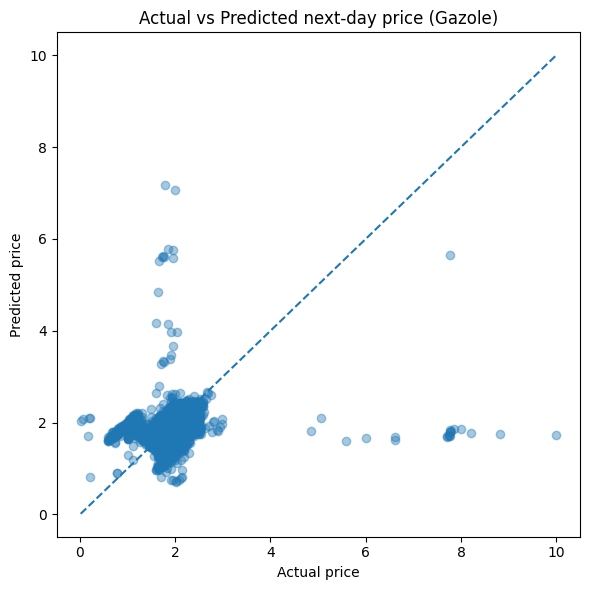

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.scatter(pdf_pred["label"], pdf_pred["prediction"], alpha=0.4)
plt.plot(
    [pdf_pred["label"].min(), pdf_pred["label"].max()],
    [pdf_pred["label"].min(), pdf_pred["label"].max()],
    linestyle="--"
)

plt.xlabel("Actual price")
plt.ylabel("Predicted price")
plt.title("Actual vs Predicted next-day price (Gazole)")
plt.tight_layout()
plt.show()

The scatter plot above compares the actual next-day prices (x-axis) with the predicted prices produced by the Linear Regression model (y-axis).

Each point represents a single observation from the test set.  
The dashed diagonal line corresponds to the ideal prediction line (prediction = actual value).  
Points lying close to this line indicate accurate predictions, while deviations represent prediction errors.

From the plot, several observations can be made:

- The majority of points are concentrated around the diagonal in the price range between approximately 1.5 and 2.5 €/L, which corresponds to the most frequent price levels in the dataset.
- This dense cluster confirms that the model performs well in the normal operating range of fuel prices.
- Some dispersion is visible for higher actual prices, where predictions tend to be less accurate.  
  This behavior is expected, as extreme price values are less frequent in the training data and are therefore harder for a linear model to predict accurately.
- A small number of outliers are visible, highlighting cases where the model underestimates or overestimates the price.

Overall, the dispersion plot is consistent with the quantitative evaluation metrics previously computed.  
It confirms that the model captures the general relationship between past prices and next-day prices, while also illustrating the inherent variability and limitations of a simple linear approach.


In [56]:
# Convert a sample to pandas for plotting
pdf_prices = gas_df.select("price").sample(fraction=0.02, seed=42).toPandas()

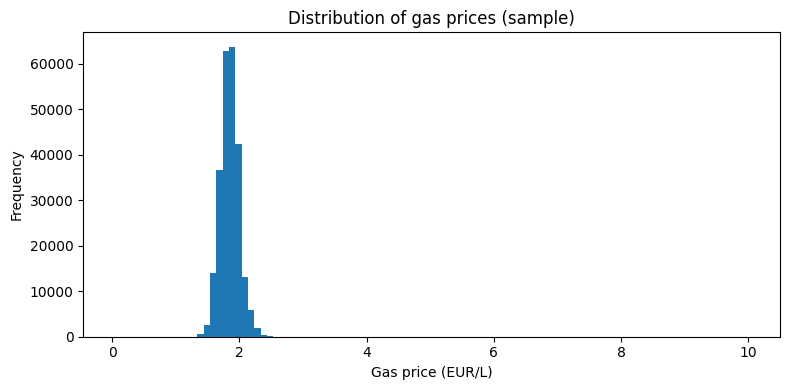

In [57]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.hist(pdf_prices["price"], bins=100)
plt.xlabel("Gas price (EUR/L)")
plt.ylabel("Frequency")
plt.title("Distribution of gas prices (sample)")
plt.tight_layout()
plt.show()

## **Modeling**: Next-Day Price Forecasting with Random Forest Regression

A Random Forest Regressor is employed to model next-day fuel prices since, unlike linear models, they are able to capture non-linear relationships and interactions between input features, such as in fuel price dynamics.

The model is trained using the same lag-based features (previous-day prices,
month, and week index), allowing a direct comparison with the linear regression
approach. This second model therefore aims to assess whether a more flexible,
ensemble-based method can improve predictive performance without relying on
explicit time-series assumptions.


In [58]:
from pyspark.ml.regression import RandomForestRegressor

In [59]:
# Random Forest regressor
rf = RandomForestRegressor(
    featuresCol="features",
    labelCol="label",
    numTrees=50,
    maxDepth=8,
    seed=42
)

Hyperparameters are selected to ensure a good trade-off between model complexity
and interpretability:
- Number of trees = 50, sufficient to stabilize predictions while keeping training time reasonable;
- Tree depth = 8, in order to reduce overfitting and encourage generalization.


In [60]:
# Train the model on the training dataset
rf_model = rf.fit(train_df)

In [61]:
# Apply the trained model to the test dataset
rf_predictions = rf_model.transform(test_df)

# Display a sample of actual vs predicted next-day prices
rf_predictions.select("label", "prediction").show(10, truncate=False)

+-----+------------------+
|label|prediction        |
+-----+------------------+
|1.91 |1.9863788508523503|
|2.019|1.9280072214274548|
|2.086|1.9734432439178928|
|2.118|1.9827704818375034|
|1.593|1.5898810964321834|
|1.619|1.6040092338574907|
|1.659|1.5725581805553945|
|1.629|1.6288052133671385|
|1.83 |1.582685151902482 |
|1.657|1.7119891241352576|
+-----+------------------+
only showing top 10 rows


The Random Forest model produces stable and realistic predictions.
Compared to linear regression, predictions are less sensitive to extreme values,
indicating a better handling of non-linear effects and interactions between features.
The predicted prices remain close to observed values, confirming the relevance
of lag-based features for short-term price forecasting.


In [62]:
rf_rmse = evaluator_rmse.evaluate(rf_predictions)
rf_mae = evaluator_mae.evaluate(rf_predictions)
rf_r2 = evaluator_r2.evaluate(rf_predictions)

print(f"Random Forest RMSE: {rf_rmse:.4f}")
print(f"Random Forest MAE : {rf_mae:.4f}")
print(f"Random Forest R2  : {rf_r2:.4f}")

Random Forest RMSE: 0.0572
Random Forest MAE : 0.0279
Random Forest R2  : 0.8539


The Random Forest model achieves good predictive performance on the test set.
The RMSE and MAE values show that the average prediction error is relatively
small compared to the typical price range of fuel prices, confirming accurate
short-term forecasts.

The model explains a huge portion of the total variance in next-day prices as shown by the $R^2$ value, approximately equal to 0.85, highlighting the benefit of capturing non-linear relationships through an ensemble-based approach.


In [63]:
# Convert to pandas for plotting
rf_pdf = rf_predictions.select("label", "prediction").toPandas()

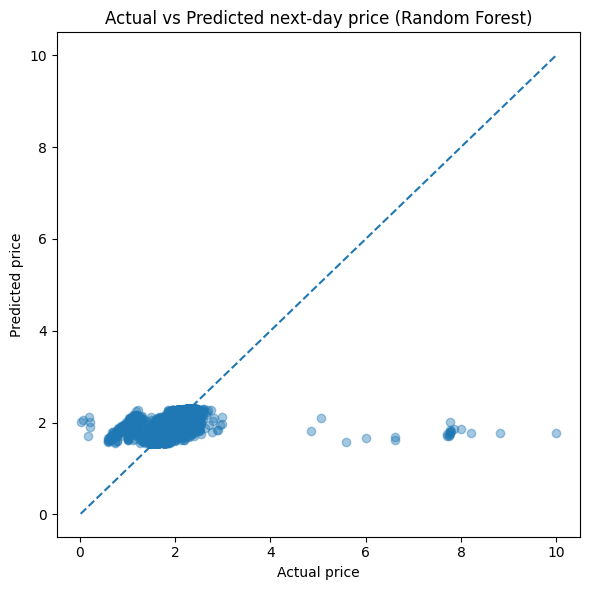

In [64]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 6))
plt.scatter(rf_pdf["label"], rf_pdf["prediction"], alpha=0.4)
plt.plot(
    [rf_pdf["label"].min(), rf_pdf["label"].max()],
    [rf_pdf["label"].min(), rf_pdf["label"].max()],
    linestyle="--"
)

plt.xlabel("Actual price")
plt.ylabel("Predicted price")
plt.title("Actual vs Predicted next-day price (Random Forest)")
plt.tight_layout()
plt.show()


The scatter plot compares actual next-day fuel prices with the values predicted
by the Random Forest model, where the dashed diagonal line represents perfect predictions.

Most points are concentrated close to the diagonal in the main price range, approximately between 1.5 and 2.2 €/L, proving good predictive accuracy
for the majority of observations. This confirms that the model performs well
under typical market conditions.

Some points appear far from the diagonal at very high price values. These
observations correspond to rare or extreme price records, which are poorly
represented in the training data. As a result, the model tends to regress
predictions toward the average in these cases, a common behavior of ensemble
methods.

## **Model Comparison**: Linear Regression vs Random Forest Regression



In [65]:
print("MODEL COMPARISON")
print("----------------")
print(f"Linear Regression  RMSE: {rmse:.4f} | MAE: {mae:.4f} | R2: {r2:.4f}")
print(f"Random Forest      RMSE: {rf_rmse:.4f} | MAE: {rf_mae:.4f} | R2: {rf_r2:.4f}")

MODEL COMPARISON
----------------
Linear Regression  RMSE: 0.0656 | MAE: 0.0325 | R2: 0.8083
Random Forest      RMSE: 0.0572 | MAE: 0.0279 | R2: 0.8539


As shown in the table above, the Random Forest outperforms Linear Regression across all evaluation metrics.
Both RMSE and MAE are lower, pointing out more accurate predictions on average,
while the higher $R^2$ value shows that the Random Forest explains a larger amount of the variance in next-day fuel prices.

Although Linear Regression provides a simple and interpretable baseline,
its performance is limited by the assumption of linear relationships.
In contrast, the Random Forest model is able to capture non-linear effects
and interactions between lagged prices and temporal features, resulting in
improved predictive accuracy.


## Evaluation of the impact of electric vehicles on gas prices


This section explores the potential impact of electric vehicle adoption on fuel prices.
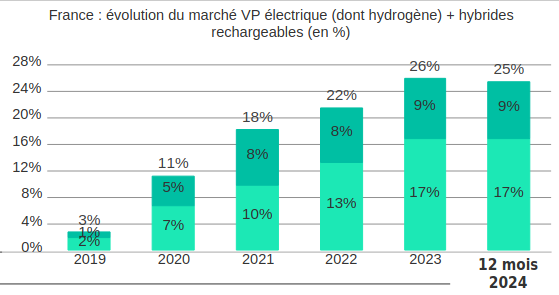

The chart ([link](https://pfa-auto.fr/marche-automobile/)) illustrates the evolution of the market share of electric vehicles in France, including battery electric vehicles, plug-in hybrids, and hydrogen-powered vehicles.

Focusing on the period 2022–2024, the share of these technologies increases significantly:
- in 2022, electric and hybrid vehicles represent approximately 22% of new registrations,
- in 2023, the share rises to around 26%,
- during 2024, it stabilizes at about 25%.

This growth is mainly driven by battery electric vehicles, while plug-in hybrids maintain a relatively stable contribution. Overall, the trend reflects a structural
change in the vehicle fleet and in energy consumption patterns.  Given this evolution, it is relevant to investigate whether the increasing adoption
of electric vehicles may have an impact on the dynamics of traditional fuel prices.

To conduct this evaluation, the analysis leverages two previously constructed indicators: the `price Index`, which measures the relative deviation of station prices from the national average, and the continuous `week Index`, which provides a consistent temporal axis across the full observation period.

In [66]:
# Weekly average Price Index per gas type
spark.sql("""
CREATE OR REPLACE TEMP VIEW weekly_price_index AS
SELECT
    gas_type,
    week_index,
    AVG(price_index) AS avg_weekly_price_index
FROM gas_with_week_index
GROUP BY gas_type, week_index
ORDER BY gas_type, week_index
""")

spark.sql("""
SELECT *
FROM weekly_price_index
LIMIT 10
""").show()


+--------+----------+----------------------+
|gas_type|week_index|avg_weekly_price_index|
+--------+----------+----------------------+
|     E10|         1|     99.99999999999892|
|     E10|         2|    100.00000000000146|
|     E10|         3|     99.99999999999987|
|     E10|         4|    100.00000000000105|
|     E10|         5|     99.99999999999969|
|     E10|         6|     99.99999999999935|
|     E10|         7|     100.0000000000038|
|     E10|         8|    100.00000000000084|
|     E10|         9|     99.99999999999669|
|     E10|        10|     99.99999999999976|
+--------+----------+----------------------+



In [67]:
spark.sql("""
SELECT
    gas_type,
    MIN(avg_weekly_price_index) AS min_index,
    MAX(avg_weekly_price_index) AS max_index,
    AVG(avg_weekly_price_index) AS mean_index
FROM weekly_price_index
GROUP BY gas_type
""").show()


+--------+-----------------+------------------+------------------+
|gas_type|        min_index|         max_index|        mean_index|
+--------+-----------------+------------------+------------------+
|     E10| 99.9999999999812|100.00000000001644|100.00000000000017|
|    SP98|99.99999999998526|100.00000000001593| 100.0000000000005|
|  Gazole|99.99999999999214|100.00000000000918| 99.99999999999989|
|    SP95|99.99999999999771|100.00000000000203|100.00000000000021|
+--------+-----------------+------------------+------------------+



By construction, the average Price Index remains centered around 100 for all gas types, which confirms the correctness of the normalization procedure. Comparing weekly Price Index values across time does not reveal any structural downward trend or stabilization that could be associated with an increasing penetration of electric vehicles. This result holds consistently across all major fuel types, including Gazole, SP95, SP98, and E10.

In [68]:
spark.sql("""
SELECT
    gas_type,
    CASE
        WHEN week_index <= 78 THEN 'First period (2022–mid 2023)'
        ELSE 'Second period (mid 2023–2024)'
    END AS period,
    AVG(avg_weekly_price_index) AS avg_index
FROM weekly_price_index
GROUP BY gas_type, period
ORDER BY gas_type, period
""").show()


+--------+--------------------+------------------+
|gas_type|              period|         avg_index|
+--------+--------------------+------------------+
|     E10|First period (202...| 100.0000000000001|
|     E10|Second period (mi...|100.00000000000011|
|  Gazole|First period (202...|100.00000000000003|
|  Gazole|Second period (mi...| 99.99999999999973|
|    SP95|First period (202...|100.00000000000021|
|    SP95|Second period (mi...|100.00000000000016|
|    SP98|First period (202...| 99.99999999999964|
|    SP98|Second period (mi...|100.00000000000138|
+--------+--------------------+------------------+



Furthermore, a comparison between the first half of the period (2022 to mid-2023) and the second half (mid-2023 to 2024) does not show any significant divergence in relative price levels. The Price Index remains remarkably stable across periods, indicating that relative pricing patterns have not shifted in a way that would suggest a demand-driven pressure linked to electric vehicle adoption.

In [69]:
spark.sql("""
SELECT
    gas_type,
    STDDEV(avg_weekly_price_index) AS index_volatility
FROM weekly_price_index
GROUP BY gas_type
""").show()


+--------+--------------------+
|gas_type|    index_volatility|
+--------+--------------------+
|     E10|2.862771963726272...|
|    SP98|3.748982860785245...|
|  Gazole|2.977028956837345...|
|    SP95|8.04827783821797E-13|
+--------+--------------------+



The analysis of volatility provides additional insight.
Price Index volatility measures the extent to which relative fuel prices fluctuate over time around the national average.
It remains substantial for most fuel types, particularly for Gazole and SP98, indicating that fuel prices continue to be strongly influenced by external macroeconomic and geopolitical factors. Such volatility is not consistent with a dominant substitution effect that would gradually dampen price fluctuations as electric vehicle adoption increases.

Overall, despite the clear growth of electric vehicles observed in the French market, the results obtained from price-based indicators do not provide evidence of a measurable impact on gas prices over the studied period. This suggests that, between 2022 and 2024, fuel price dynamics were largely driven by broader economic forces rather than by changes in vehicle fleet composition.

## Conclusion

In this project, a complete data processing and analysis pipeline was developed to study fuel price dynamics in France using Apache Spark. Starting from raw station-level data, the workflow included data cleaning, temporal aggregation, and feature engineering to construct robust analytical datasets suitable for large-scale analysis.

Exploratory analysis and data visualization highlighted both temporal and spatial patterns in fuel prices. Weekly trend analysis revealed strong co-movements across gas types, while geographic heat maps at department level uncovered persistent regional price disparities, demonstrating the importance of spatial granularity beyond national averages.

For the modeling task, next-day fuel prices were forecast using Spark ML. A linear regression model was first employed as a baseline, followed by a Random Forest regressor to capture non-linear effects. The Random Forest model achieved superior predictive performance, confirming the relevance of lag-based features and ensemble learning for short-term fuel price forecasting.

Finally, the project investigated whether the rapid adoption of electric and hybrid vehicles in France between 2022 and 2024 could be associated with measurable changes in fuel price dynamics. Despite the clear growth in electric vehicle market share over this period, the analysis of weekly Price Index indicators shows that relative fuel prices remain centered around the national average (index ≈ 100), with no significant structural shifts across gas types or time periods. Comparisons between early and late sub-periods, as well as volatility analysis, do not reveal evidence of a substitution-driven pressure on fuel prices.

Overall, the results suggest that, during the observed timeframe, fuel price dynamics in France were predominantly driven by broader macroeconomic and geopolitical factors rather than by changes in vehicle fleet composition.